# Training your own GAN

Adapted from Alex Andonian's "Training DCGAN"

#### Intro to GANs!!

Hi there! Welcome to this jupyter notebook! The goal of this tutorial is to introduce you to Generative Adversarial Networks (GANs) and how to train them.

A **GAN**, Generative Adversarial Network, is a type of **machine learning** that uses a strategy involving two competing (adversarial) networks. The first network, the **generator network**, is generating new images and learning to replicate the dataset as close to reality as it can. In the beginning an unlearned generator will be producing random outputs, but as the network continues to run the accuracy of its generated image outputs will improve and look more similar to the original dataset. The objective of the generator is to learn how to generate realistic looking images to trick the second **discriminator network** into thinking it is a real image. The discrimator network in the GAN is pretrained and already knows the dataset. So, you can imagine, in abstract, that each time the generator generates new images, the discriminator 'gives feedback' on where the generator went wrong and gives confirmation about the areas the generator is doing well to teach it how to make better outputs. 

As the system continues to run 100s and 1000s of times, the generator will learn how to produce more realistic images and the discriminator will continue to learn how to distinguish the generated images from the real dataset. The generator network is training to generate an image near indistinguishable to a true image to "trick" the discriminator, while the discriminator is simultaneously training to increase its accuracy of distinguishing a generated image from a real image of the dataset. This competition allows the networks to continuously improve their accuracy with each run of the system.

[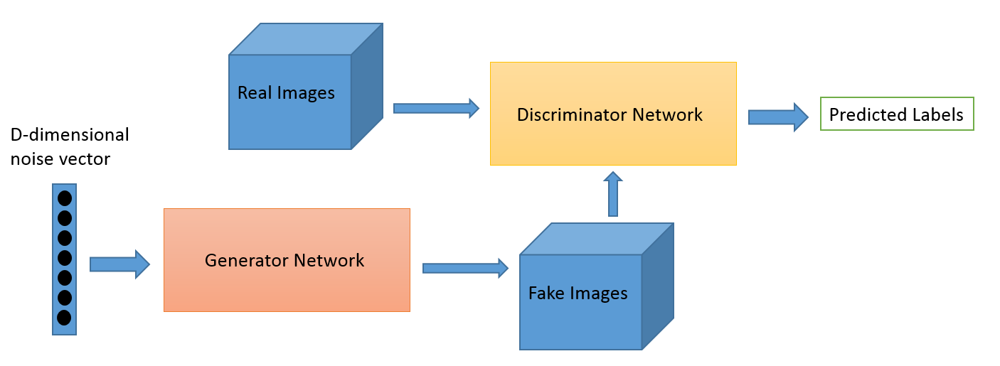](https://towardsdatascience.com/generative-adversarial-networks-gans-a-beginners-guide-5b38eceece24)

###### What does an image look like to a computer and how does it learn things about an image?
To a computer, an image is a series of numbers. Each pixel of an image is given a number from a scale. All pixels of the image are given a number and listed according to its dimensions. This list of numbers inform the computer about the individual pixel's information and color. Training a GAN teaches the generator to understand patterns of numbers in an image. Below are images of numbers from the [MNIST](http://yann.lecun.com/exdb/mnist/) number experiment where the computer was learning to recognize handwritten numbers. The range of color in the images is from black-white (greyscale), where the colors are correlated to increasing weights of numbers similar to the connections of weights in between network layers. 
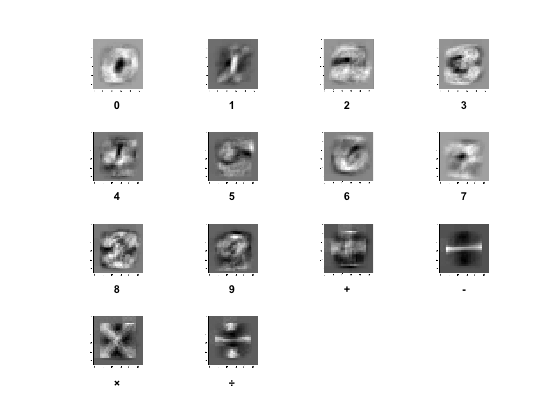

**Fun Fact:** GANs have seen tremendous progress in their short 5 year lifespan. GANs just celebrated their 5th anniversary on May 26, 2019. The rapid progress of GANs' success in image synthesis is particularly impressive:

In light of the enormous volume of work devoted to GANs, it is nearly impossible to cover everything. Instead, we will start at the beginning with Deep Convolutional GANs or [**DCGANs**](https://towardsdatascience.com/dcgans-deep-convolutional-generative-adversarial-networks-c7f392c2c8f8), which set the stage for the success we are seeing today. In brief, DCGANs are a type of [convolutional network](https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53) that has a multi-layered architecture. These layers expand and increase in dimension as the system develops to process and retain more information about the dataset. DCGANs were developed in 2015, these were one of the first major improvements from the original GAN. DCGANs are still highly relevant and foundational to GANS. 

### Examples of the different types of GANs:

##### [Style GANs ](https://towardsdatascience.com/explained-a-style-based-generator-architecture-for-gans-generating-and-tuning-realistic-6cb2be0f431)
This specific example of a Style GAN is using a generator trained on images of zebras to generate stripes on a video input of a horse:
[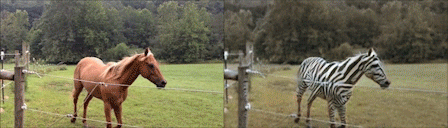](https://towardsdatascience.com/explained-a-style-based-generator-architecture-for-gans-generating-and-tuning-realistic-6cb2be0f431)

##### [Progressive GANs](https://towardsdatascience.com/progressively-growing-gans-9cb795caebee)
This is an example of a ProGAN. On the left is the early output of a ProGAN. As the pictures go to the right, you'll see a progression of accuracy. The right image shows how far the development of these layered GANs and the accuracy of their generated outputs. We will be using these in our next jupyter tutorial "Looking Inside a GAN".
[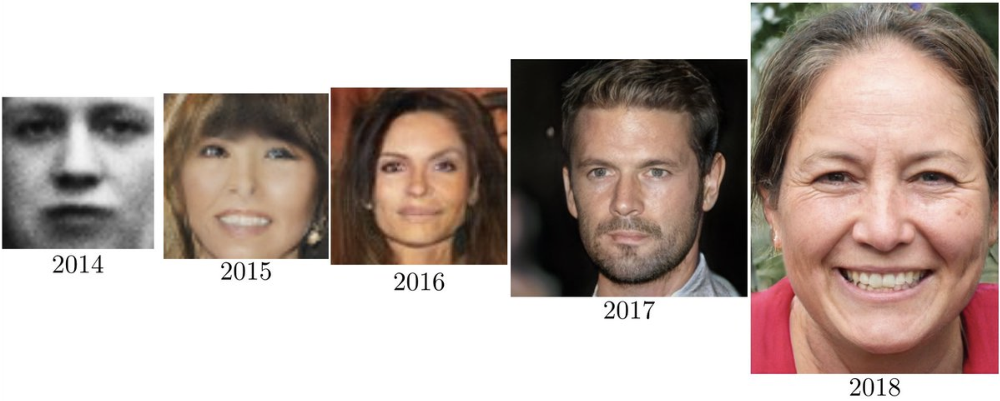](http://ganocracy.csail.mit.edu/tutorial/tutorial.html)

##### [BIGGANs](https://medium.com/syncedreview/biggan-a-new-state-of-the-art-in-image-synthesis-cf2ec5694024)
Heres an example of a Large Scale GAN training dataset. The goal of BIGGANs is to successfully train to generate high resolution images at the largest scale tested of any of the other GANs. 
[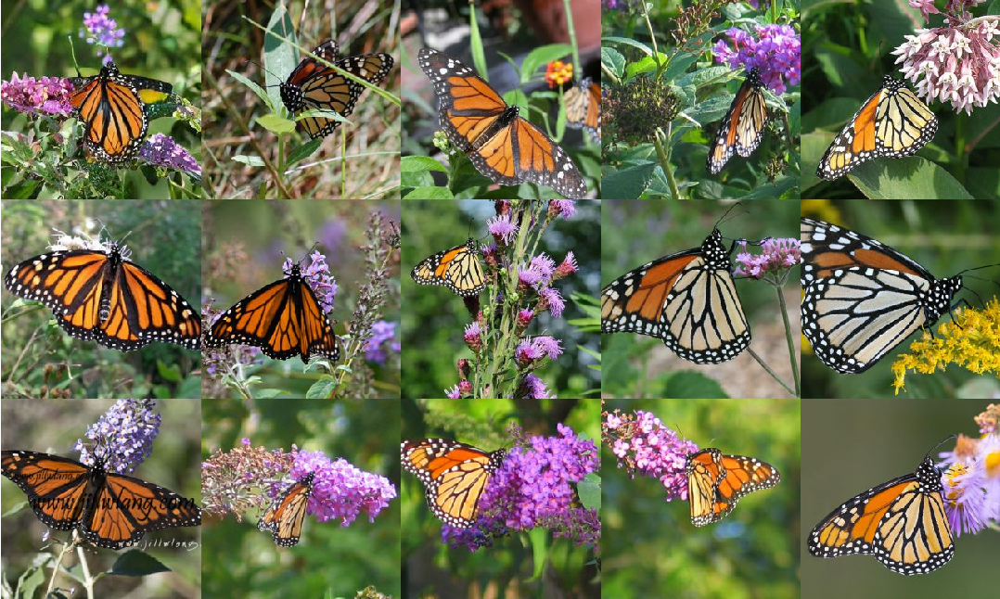](https://medium.com/syncedreview/biggan-a-new-state-of-the-art-in-image-synthesis-cf2ec5694024)

Here's a timeline of types of GANs that have developed since 2014:
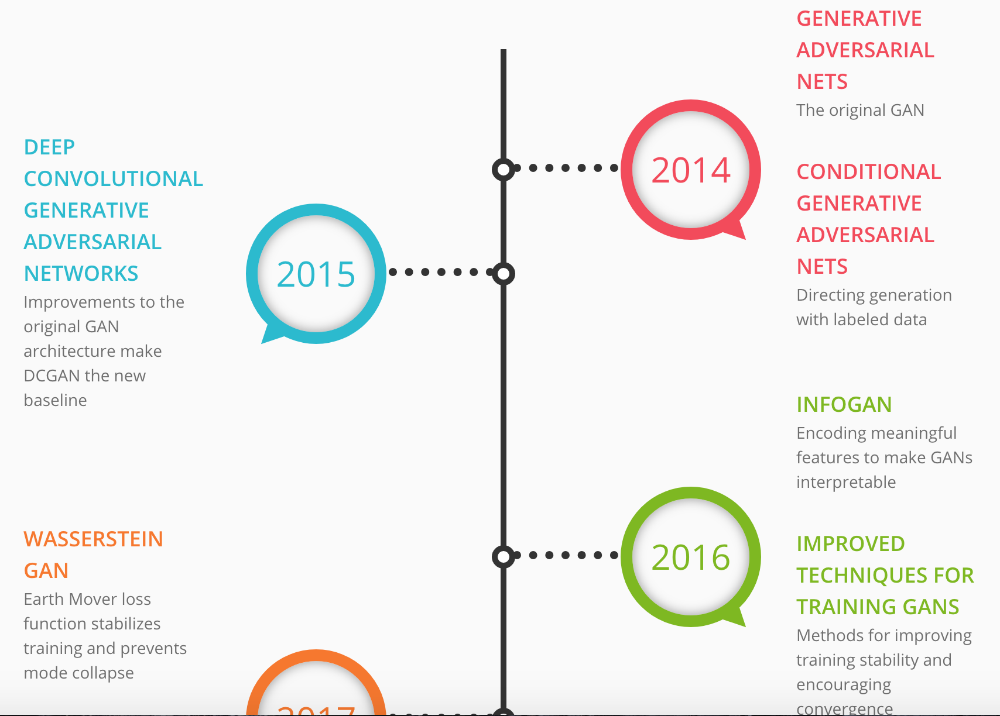
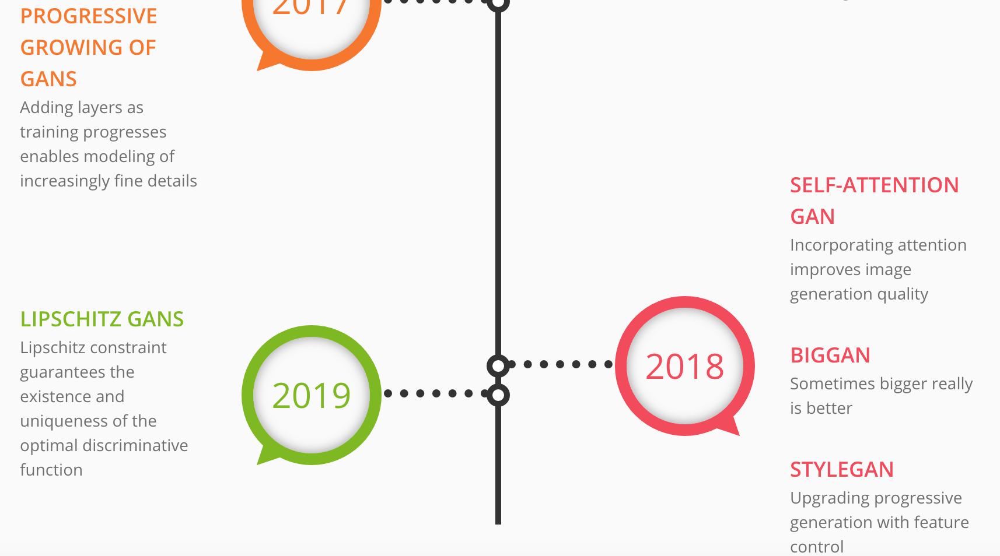

##### Now let's take a look at how to set up our GAN! 

## The set up
First, let's start with some set set up and imports of all the python packages we will use throughout the tutorial. In addition to standard import and PyTorch, we provide a small package called `ganocracy`, which aggregates a host of useful GAN specific functions and utilities in one place - a "one-stop-shop" for everything needed to get started with GANs. (explain the functions and utilities a little, importing the libraries allows later code to have access to the functions and utilities of the libraries).

Almost all code shown in this notebook can be found inside the `ganocracy` package. We house reference implementations outside of the notebook so that bits and pieces can be conveniently incorporated into other projects, (without having to copy and paste from this notebook).

These import functions allow us to download external libraries into jupyter notebooks. There is no immediate output of importing libraries, it just sets up information for later code.

In [1]:
# IMPORTS
import os 
import sys
import numpy as np
import random
from PIL import Image

# PYTORCH
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision

# GANOCRACY LIB
import ganocracy
from ganocracy.data import datasets as dset
from ganocracy.data import transforms
from ganocracy import metrics, models
from ganocracy.models import utils as mutils
from ganocracy.utils import visualizer as vutils

# NOTEBOOK-SPECIFIC IMPORTS
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, Video
try:
    import moviepy.editor as mpy
except ImportError:
    print('WARNING: Could not import moviepy. Some cells may not work.')
    print('You can install it with `pip install moviepy`')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
    
# Set random seem for reproducibility.
manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)

# Use this command to make a subset of
# GPUS visible to the jupyter notebook.
os.environ['CUDA_VISIBLE_DEVICES'] = '0,1,2,3,4,5'

## Customize your own dataset!

Try training a GAN with your own images! Try using pictures of your favorite animal, hobby or of your friends.

If you would like to train a GAN on a your own custom dataset, subclassing [`torch.utils.data.Dataset`](https://pytorch.org/docs/stable/data.html#torch.utils.data.Dataset) is a sensible approach as it allows you to make use of PyTorch's dataloading utilities, including the multi-threaded dataLoader and transforms from above.

**If your training data consist of image files, the [`torchvision.datasets.ImageFolder`](https://pytorch.org/docs/stable/torchvision/datasets.html#imagefolder) class facilitates convenient dataloading. Simply arrange your files in the following way:**

For a network to train on a dataset of images, it is very important to note how the data is inputted. A network requires a certain format and standard for the images going in for the best outcome. To train properly and effectively, it also needs a wide range of images and a representative sample of what you are training for. Depending on the type of images you are training for and the variability or range of an object class, it will need a larger more diverse training sample. For example, the look of dogs vary greatly from different breeds, so the network will need examples of many of those different types of dogs. Whereas, if you were training on images of say baseballs, they are relatively identical and not widely varying, so the network can train on fewer images. 

To properly input the images for a dataset, arrange them like this. The network requires a set format for how images are inputted, so it can properly take the dataset with compatible configurations.

    root/dog/xxx.png
    root/dog/xxy.png
    root/dog/xxz.png

    root/cat/123.png
    root/cat/nsdf3.png
    root/cat/asd932_.png
    
where each subdirectory of `root` is considered an image category containing examples of that category. Then, you can create your dataset with:

```python
dataroot = '/path/to/data/root'
dataset = torchvision.datasets.ImageFolder(dataroot transforms=transforms.Compose([
                                     transforms.Resize(resolution),
                                      transforms.CenterCrop(resolution),
                                                                  transforms.ToTensor(),                           transforms.Normalize((0.5, 0.5, 0.5),  # Normalize between -1 and 1.
                                                               (0.5, 0.5, 0.5))]),
                                       target_transform=lambda x: 0))
```

Below, we configure how the notebook will run and fill it with sensible defaults:

In [2]:
TRAIN = True

# ---------------------
# DATASET/Loader CONFIG
# ---------------------
dataset_name = 'celebA'        # Name of dataset. This is where you can change and substitute in your own dataset.
# dataset_name = 'your own dataset'

dataroot = "data/celebA"       # Root directory for the dataset.
# dataroot = "data/celebA"   

download = True         # If data is not found, download and cache it.


split = 'train'         # Dataset split (train or val), if applicable.
num_workers = 1         # Number of workers for dataloader
batch_size = 96         # Batch size per forward/backward pass.

resolution = 128  # Image size (H, W) in pixels. Choices: [32, 64, 128, ...]. The network requires a set format for how images are inputted, so it can properly take the dataset. These choices represent the choices for configurations for images of a dataset. Resized if needed.

# ------------------
# Model Architecture
# ------------------
dim_z = 100 # Size of z latent vector (i.e. size of generator input)
G_ch = 64   # Channel multiplier - scales number of features per conv in G and D
D_ch = 64

# ---------------
# TRAINING CONFIG
# ---------------
num_epochs = 50 # Number of training epochs (1 epoch = 1 presentation of full dataset).

num_D_steps = 1         # Number of updates to Discriminator per 1 step of Generator.
num_D_accumulations = 1 # Number of gradient accumulations per step of G and D.
num_G_accumulations = 1 # Technique to spoof larger "mega-batch" sizes.
D_batch_size = batch_size * num_D_steps * num_D_accumulations

test_every = 500   # How frequently to evaluate our model. Use None to skip testing.
sample_every = 100 # How frequently we save fixed noise samples.

# ----------------
# OPTIMIZER CONFIG
# ----------------
G_lr = 2e-4      # Learning rate for optimizers
D_lr = 2e-4      

# Betas hyperparams for Adam optimizers
G_betas = (0.5, 0.999)
D_betas = (0.5, 0.999)

# ---------------
# HARDWARE CONFIG
# ---------------
ngpu = 6 # Number of GPUs available. Use 0 for CPU mode

# Determine whether or not GPUs are available.
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


# -----------
# SAVE CONFIG
# -----------
name = 'LIVE_DEMO'         # Experiment specific prefix.
model_dir = 'checkpoints'  # Directory to store model checkpoints.
samples_dir = 'samples'    # Directory to store samples.

# Generate model name based on config.
model_name = '_'.join(map(str, [
    name,
    dataset_name, 
    resolution,
    'bs{}'.format(batch_size),
    'dim_z{}'.format(dim_z),
    'G_ch{}'.format(G_ch),
    'D_ch{}'.format(D_ch),
    'G_lr{}'.format(G_lr),
    'D_lr{}'.format(D_lr),
    'G_betas{}'.format('_'.join(map(str, G_betas))),
    'D_betas{}'.format('_'.join(map(str, D_betas))),
]))

# Prepare dirs to store samples and checkpoints.
save_name = os.path.join(model_dir, model_name)
os.makedirs(os.path.join(model_dir, model_name), exist_ok=True)
os.makedirs(os.path.join(samples_dir, model_name), exist_ok=True)
print(f'Starting experiment {model_name}')

Starting experiment LIVE_DEMO_celebA_128_bs96_dim_z100_G_ch64_D_ch64_G_lr0.0002_D_lr0.0002_G_betas0.5_0.999_D_betas0.5_0.999


## Data Preparation
In this tutorial, we will be using the CelebFaces Attributes Dataset (CelebA), which is a dataset with more than 200K celebrity images that has a range of large-scale face attributes. Each individual image is annotated with 40 attributes that describe details on the faces (e.g. smiling, eyeglasses, etc.). 

We can download this dataset (along with a host of other commonly used datasets) with PyTorch's [`torchvision`](https://pytorch.org/docs/stable/torchvision/index.html) package. Support for downloadng an number of new datasets was just added in version 0.3.0!

116916224it [00:20, 38802940.58it/s]
0it [00:00, ?it/s]
1540096it [00:00, 15292505.57it/s]
3538944it [00:00, 16366023.84it/s]
6553600it [00:00, 18956277.66it/s]
10059776it [00:00, 21930703.30it/s]
13893632it [00:00, 25158081.54it/s]
17235968it [00:00, 27162790.32it/s]
20086784it [00:00, 27476697.97it/s]
24051712it [00:00, 30152784.89it/s]
27623424it [00:00, 31599881.69it/s]
31227904it [00:01, 32737989.89it/s]
34799616it [00:01, 33570157.89it/s]
38436864it [00:01, 34361687.70it/s]
42172416it [00:01, 35170425.01it/s]
46628864it [00:01, 37527834.75it/s]
50724864it [00:01, 38452247.01it/s]
55115776it [00:01, 39922091.34it/s]
59179008it [00:01, 38650150.14it/s]
63111168it [00:01, 38324266.42it/s]
66977792it [00:01, 31821206.27it/s]
70385664it [00:02, 31213695.20it/s]
74514432it [00:02, 33664690.78it/s]
78708736it [00:02, 35718122.68it/s]
82804736it [00:02, 37022207.95it/s]
86638592it [00:02, 35258275.08it/s]
90603520it [00:02, 36430457.76it/s]
94994432it [00:02, 38359351.54it/s]
98926592it 

Dataset CelebA
    Number of datapoints: 162770
    Root location: data/celebA
    Target type: ['attr']
    Split: train


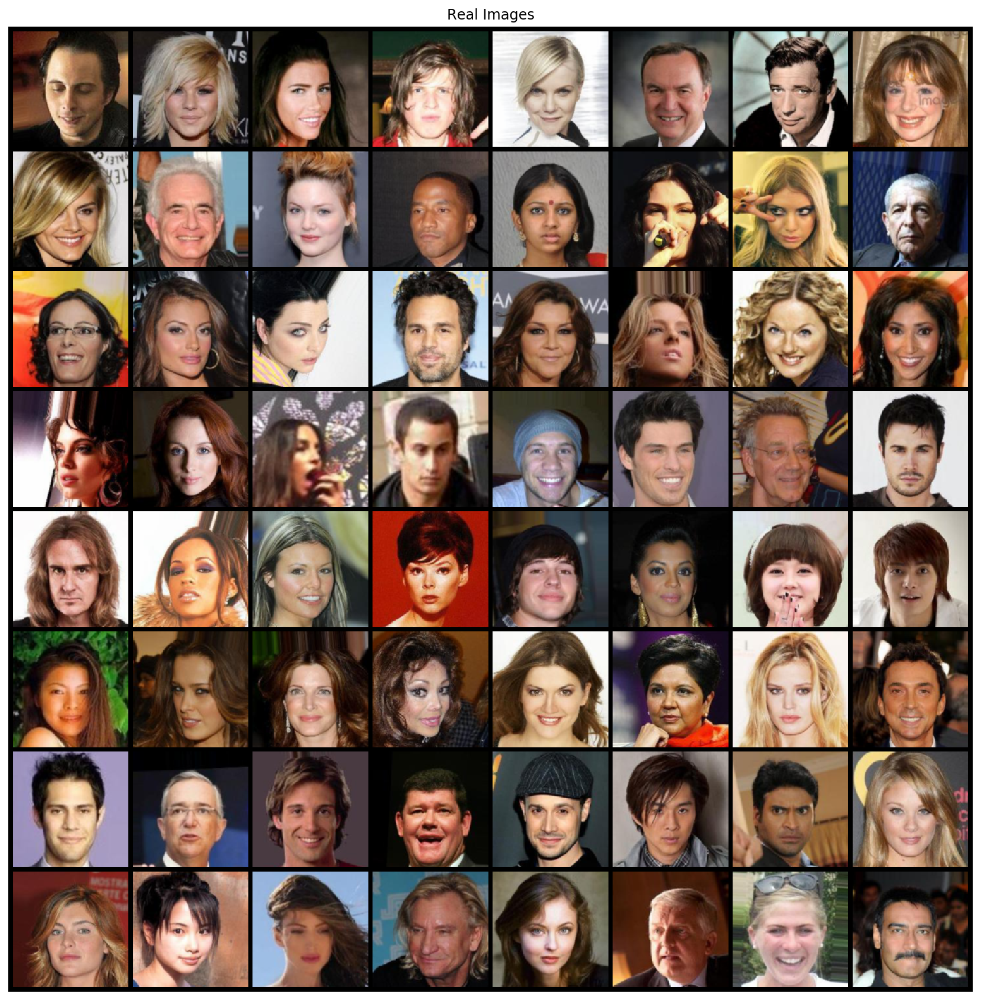

In [14]:
# If you choose to use your own data set you can uncomment it here. Uncomment whichever dataset you would like to train your system on.  
# Create the dataset with transforms.
# Create the dataset with transforms.
dataset = torchvision.datasets.CelebA(dataroot,
                                      download=download,
                                      transform=transforms.Compose([
                                          transforms.Resize(resolution),
                                          transforms.CenterCrop(resolution),
                                          transforms.ToTensor(),
                                          transforms.Normalize((0.5, 0.5, 0.5),  # Normalize between -1 and 1.
                                                               (0.5, 0.5, 0.5))]),
                                       target_transform=lambda x: 0)

# dataset = torchvision.datasets.ImageFolder(dataroot,
#                                       transform=transforms.Compose([
#                                           transforms.Resize(resolution),
#                                           transforms.CenterCrop(resolution),
#                                           transforms.ToTensor(),
#                                           transforms.Normalize((0.5, 0.5, 0.5),  # Normalize between -1 and 1.
#                                                                (0.5, 0.5, 0.5))]),
#                                        target_transform=lambda x: 0)
# Create the dataloader.
dataloader = torch.utils.data.DataLoader(dataset, 
                                         shuffle=True,
                                         batch_size=D_batch_size,
                                         num_workers=num_workers)
# Let's take a look at some samples
vutils.visualize_data(dataloader)

### Prepare data (optional, for additional performance)

If your dataset consists of large, high-resolution images, then repeatedly applying transforms to the raw images (cropping, resizing) results in many wasted CPU cycles. Furthermore, increasing your batchsize puts additional I/O strain on your filesystem. Together, these factors may produce a dataloading bottleneck where your GPUs consume data faster than your system can produce it. To remedy this, you may choose to prepare a pre-processed HDF5 version of your target dataset using the utilities provided.

Another advantage to using a single, preprocessed HDF5 is the ease with which you can transfer data to multiple remote machines, which normally becomes cumbersome and time consuming when attempting large, distributed experiments.

### Measuring a sample's quality during training 

##### This is an optional step and not always possible to do, but if you'd like to see how the quality of samples in training are measured. 
Typically, when training any sort of neural network, it is standard practice to monitor the value of the objective function (loss) throughout the course of the experiment; adversarial losses measure the competition between the generator and discriminator. However, the adversarial losses do not necessarily reflect the image quality of generated samples. 

In the early day of GAN research, samples were compared visually. On the other hand, objectively evaluating implicit generative models still remains difficult and an active area of investigation. Despite their notable flaws, researchers have recently settled on two popular metrics, which aim to capture image quality and diversity:

- **Inception Score (IS):** Score based on how confidently an ImageNet-pretrained InceptionV3 network can classify generated samples and the diversity of its predictions over large collection of samples. If a model produces samples that InceptionV3 can confidently classify, this contributes to a higher IS. A high diversity of classifications also contributes to a higher IS. 

- **Fréchet Distance (FID):** Here, a pretrained Inception Network is used to generate feature representations for both the real images from the dataset of interest and generated samples from the model. These feature distributions are modeled by multivariate Guassian distributions. The shorter the Fréchet Distance between these two distributions, the more closely the fake images resemble the real ones. 

Summary

- Higher IS values mean better image quality and diversity (usually).
- Lower FID values mean better image quality and diversity.

#### Some Caveats
Since the InceptionV3 model is trained to classify ImageNet categories, Inception Score can be a very poor measure of quality on datasets other than ImageNet. Unless your dataset if very *ImageNet-like*, FID will likely be a better estimate of sample quality.

In [ ]:
if TRAIN and test_every is not None:
    # If we are going to evaluate IS and FID, we need to precompute Inception moments.
    inception_moments_file = metrics.calculate_inception_moments(dataloader, dataroot,
                                                                 '-'.join([dataset_name, str(resolution)]),
                                                                 device=device)
    compute_inception_metrics = metrics.prepare_inception_metrics(inception_moments_file)


  0%|          | 0/1696 [00:00<?, ?it/s]

Parallelizing Inception module...



 17%|█▋        | 281/1696 [6:01:30<12:28:33, 31.74s/it]


 30%|██▉       | 508/1696 [21:31:18<11:12:32, 33.97s/it]

## Convolutional GANS 

The creation of [Deep Convolutional GANS](https://arxiv.org/abs/1511.06434) (DCGANs) represented a major step forward in the success of GAN image synthesis. DCGANs work by modeling $G$ (generator) and $D$ (discrimator) functions with covolutional neural networks (CNN). DCGANs stands as one of the most popular and successfull baseline GAN architectures. 
*CNNs are built based on the concept behind the [multi layer perceptron](https://machinelearningmastery.com/neural-networks-crash-course/) (MLP). CNNs are considered to be the regularized version of an MLP, where one neuron of a layer is connected to all the neurons of the next layer.*

**Challenge:** Design a neural network architecture for efficient and stable image generation. 

**Solution:** A fully convolutional network that does away with max pooling (DCGANs successfully eliminate connecting all of the neurons of the layers of the network as a normal CNN does). Convolutions had already proven successful for disciminative computer vision tasks since they are well suited for handling the spatial structure of images, and were introduced to GANs in this paper. The design introduces several important architectural elements:

- **Strided Convolutions**: The discriminator network uses strided convolutions instead of maxpooling (
for decreasing and simplifying the information of the  spatial dimensions. The generator uses strided transpose convolutions for upsampling.

- **Batch normalization following convolutional layers** works to combat poor initialization schemes and mode collapse. *Recall, batch norm works by normalizing the inputs features to have zero mean and unit variance.*

- **Non-linearity choices:** The generator uses ReLUs except for the output, which uses tanh. The discriminator uses LeakReLUs, which pass along small gradient signals for negative values. As a result, the discriminator can provide the generator with stronger gradients.

Below is a figure depicting the design of the Generator:
![DCGAN Generator Architecure](assets/dcgan_generator.png)

Almost all GANs used for image synthesis build on ideas introduced by DCGAN, although some modern architectures are starting to deviate from these early design decisions. None-the-less, due to its simplicity and success, DCGAN remains a good starting point for a new project.


### Implementation

In this implementation, we will build the DCGAN generator out of `GBlock`s, which increase the spatial dimensions while decreasing the feature volume depth. In this way, we can increase the desired output resolution by simply adding more blocks to our model.

In [ ]:
class GBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        super().__init__()
        self.conv = nn.ConvTranspose2d(in_channels, out_channels,
                                       kernel_size, stride,
                                       padding, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.act = nn.ReLU(True)

    def forward(self, input):
        """Forward method of GBlock.

        By default, this block increases the spatial resolution by 2:

            input:  [batch_size, in_channels, H, W]
            output: [batch_size, out_channels, 2*H, 2*W]
        """

        x = self.conv(input)
        x = self.bn(x)
        out = self.act(x)
        return out

    
class Generator(nn.Module):
    """DCGAN Generator."""

    # Maps output resoluton to number of GBlocks.
    res2blocks = {32: 3, 64: 4, 128: 5, 256: 6, 512: 7}

    def __init__(self, dim_z=100, resolution=64, G_ch=64, block=GBlock, init='N02'):
        super().__init__()

        self.G_ch = G_ch
        self.init = init
        self.dim_z = dim_z

        self.num_blocks = self.res2blocks[resolution]
        
        # Determine number of channels at each layer.
        # of the form G_ch * [..., 32, 16, 8, 4, 2, 1]
        self.ch_nums = [G_ch * (2**i) for i in range(self.num_blocks, 0, -1)]
        
        # Input layer: latent z is fed into convolution.
        self.input = block(dim_z, self.ch_nums[0], kernel_size=4, stride=1, padding=0)
        
        # Build our GBlocks 
        self.GBlocks = nn.Sequential(*[
            block(in_c, out_c)
            for in_c, out_c in zip(self.ch_nums, self.ch_nums[1:])
        ])
        
        # Final output layer produces RGB image with shape [3, resolution, resolution]
        self.out = nn.ConvTranspose2d(self.ch_nums[-1], 3, 4, 2, 1)  # RGB image has 3 channels
        self.tanh = nn.Tanh()                                        # "Squashes" out to be in range[-1, 1]
        
        self.init_weights()
        
    def forward(self, x):
        
        x = x.view(x.size(0), -1, 1, 1)
        x = self.input(x)
        
        x = self.GBlocks(x)
        x = self.out(x)
        return self.tanh(x)
    
    def init_weights(self):
        for module in self.modules():
            if (isinstance(module, nn.Conv2d)
                or isinstance(module, nn.Linear)
                or isinstance(module, nn.Embedding)):
                if self.init == 'ortho':
                    init.orthogonal_(module.weight)
                elif self.init == 'N02':
                    init.normal_(module.weight, 0, 0.02)
                elif self.init in ['glorot', 'xavier']:
                    init.xavier_uniform_(module.weight)

`DBlocks`, found in the discriminator, are near inverses to `GBlocks`, trading spatial dimension for feature depth, with the exception of using LearkyReLUs instead of ReLUs for their nonlinearities.

In [ ]:
class DBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, 
                              kernel_size, stride, padding,
                              bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.act = nn.LeakyReLU(0.2, inplace=True)
        
    def forward(self, x):
        """Forward method of DBlock.
        
        This block decreases the spatial resolution by 2:
        
            input:  [batch_size, in_channels, H, W]
            output: [batch_size, out_channels, H/2, W/2]
        """
        x = self.conv(x)
        x = self.bn(x)
        x = self.act(x)
        return x

class Discriminator(nn.Module):
    """DCGAN discriminator."""

    # Maps output resoluton to number of DBlocks.
    res2blocks = {32: 3, 64: 4, 128: 5, 256: 6, 512: 7}

    def __init__(self, resolution=128, D_ch=64, block=DBlock, init='N02'):
        super().__init__()

        self.D_ch = D_ch
        self.init = init
        # Determine number of channels at each layer.
        # Now, it's of the form D_ch * [1, 2, 4, 8, 16,]
        self.num_blocks = self.res2blocks[resolution]
        self.ch_nums = [2**i for i in range(self.num_blocks)]

        # No batchnorm in the input layer.
        self.input = nn.Sequential(
            nn.Conv2d(3, D_ch, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.DBlocks = nn.Sequential(*[
            block(D_ch * in_c, D_ch * out_c)
            for in_c, out_c in zip(self.ch_nums, self.ch_nums[1:])
        ])

        # Output is scalar converted to a probability.
        self.out = nn.Conv2d(D_ch * self.ch_nums[-1], 1, 4, 1, 0)
        self.act = nn.Sigmoid() # Sigmoid activation function.

    def forward(self, x):
        x = self.input(x)
        x = self.DBlocks(x)
        x = self.out(x)
        x = self.act(x)
        return x.view(-1)
    
    def init_weights(self):
        for module in self.modules():
            if (isinstance(module, nn.Conv2d)
                or isinstance(module, nn.Linear)
                or isinstance(module, nn.Embedding)):
                if self.init == 'ortho':
                    init.orthogonal_(module.weight)
                elif self.init == 'N02':
                    init.normal_(module.weight, 0, 0.02)
                elif self.init in ['glorot', 'xavier']:
                    init.xavier_uniform_(module.weight)

When building a new GAN, it can really useful to see exactly how the shape of the data changes as it is transformed from noise to RGB image. We provide a small utility for capturing the intermediate sizes and use it below: 

In [ ]:
# Instantiate DCGAN Generator instance.
G = Generator(dim_z=dim_z, resolution=resolution).to(device)
print(G)  # View model architecture.

# Create some input tensors.
z = torch.randn(4, G.dim_z, device=device)

# Generate samples while capturing the sizes of intermediate outputs.
Gz, names, sizes = mutils.hook_sizes(G, inputs=(z,), verbose=True)
vutils.visualize_samples(Gz, title='Samples from untrained Generator')

In [ ]:
# Create the Discriminator
D = models.dcgan.Discriminator(resolution=resolution).to(device)
print(D)  # View discriminator architecture.

# Let's pass the output of the generator to the dicriminator.
D_Gz, names, sizes = mutils.hook_sizes(D, inputs=(Gz,), verbose=True)
print('D(G(z)) should be probabilities: {}'.format(D_Gz))

## Loss Functions
Recall, the adverarial training strategy is to define a game between two competing networks:
- **generator:** a function $G$ that spawns ‘fake’ images by mapping a sorce of noise to the input space.
- **discriminator** a function $D$ that must distinguish between a generated sample or a true data sample.
In a zero-sum, non-cooperative game, the generator is trained to fool the discriminator.

In practice, it's better to start with the *non-saturating* GAN variant. The intuition for the non-saturating variant is that, in practice, it's easier to optimize the discriminator than the generator, especially early on in training. If the generator is not doing a good job yet, the gradients for the generator diminishes and the generator learns nothing. This is a case of *vanishing gradients* in $G$.


In [ ]:
# Initialize BCELoss function.
criterion = nn.BCELoss()
# Note: criterion(x, 1) = -log(x)
#       criterion(x, 0) = -log(1 - x)

# Create batch of latent vectors that we will use to visualize
# the progression of the generator.
fixed_noise = torch.randn(batch_size, dim_z, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
G_optim = optim.Adam(G.parameters(), lr=G_lr, betas=G_betas)
D_optim = optim.Adam(D.parameters(), lr=D_lr, betas=D_betas)

Before we begin training, let's prepare to monitor important quantities:

In [ ]:
# Keep a running list of various quantities:
img_list = []
G_losses = []
D_losses = []
IS_scores = []
FIDs = []
iters = 0
best_IS = 0
best_FID = 9999

In [ ]:
# Training Loop
if TRAIN:
    print("Starting Training Loop...")
    
    # For each epoch
    for epoch in range(num_epochs):
        # For each batch in the dataloader
        for i, data in enumerate(dataloader, 0):
            
            counter = 0 # Keep track of "mini-batches"
            data = [d.to(device) for d in data]
            x, y = [torch.split(d, batch_size) for d in data]
            
            real_labels = torch.full((batch_size,), real_label, device=device)
            fake_labels = torch.full((batch_size,), fake_label, device=device) 
            
            #################################################################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            #################################################################

            D.zero_grad()            
            for step_index in range(num_D_steps):
                D.zero_grad()
                for accumulation_index in range(num_D_accumulations):
                    
                    ## ** Train with all-real batch ** ##

                    # Forward real batch through D
                    output = D(x[counter]).view(-1)
                    
                    # Calculate loss on all-real batch
                    D_loss_real = criterion(output, real_labels[:output.size(0)]) / float(num_D_accumulations)
                    D_loss_real.backward()
                    D_x = output.mean().item()

                    ## ** Train with all-fake batch ** ##
                
                    # Generate batch of latent vectors and targets
                    noise = torch.randn(batch_size, dim_z, device=device)
                    
                    # Generate fake image batch with G
                    fake_image = G(noise)

                    # Classify all fake batch with D
                    output = D(fake_image.detach()).view(-1)

                    # Calculate D's loss on the all-fake batch
                    D_loss_fake = criterion(output, fake_labels[:output.size(0)]) / float(num_D_accumulations)
                    D_loss_fake.backward()
                    D_G_z1 = output.mean().item()
                    
                    # Add the gradients from the all-real and all-fake batches
                    D_loss = (D_loss_real + D_loss_fake)
                    counter += 1
                    
                # Update D
                D_optim.step()

            #############################################
            # (2) Update G network: maximize log(D(G(z)))
            #############################################
            
            G.zero_grad()
            for accumulation_index in range(num_G_accumulations):
                
                # Generate batch of latent vectors.
                noise = torch.randn(batch_size, dim_z, device=device)
                fake_image = G(noise)
                output = D(fake_image).view(-1)
                
                # Calculate G's loss based on this output
                G_loss = criterion(output, real_labels) / float(num_G_accumulations)
                    
                # Calculate gradients for G
                G_loss.backward()
                D_G_z2 = output.mean().item()
                
            # Update G
            G_optim.step()
            
            # Output training stats
            if i % 10 == 0:
                print('[{}/{}][{}/{}]\tLoss_D: {:.4f}\tLoss_G: {:.4f}\tD(x): {:.4f}\tD(G(z)): {:.4f} / {:.4f}'.
                     format(epoch, num_epochs, i, len(dataloader),
                            D_loss.item(), G_loss.item(), D_x, D_G_z1, D_G_z2))

            # Save Losses for plotting later
            G_losses.append(G_loss.item())
            D_losses.append(D_loss.item())

            # Check how the generator is doing by saving G's samples on fixed_noise
            if (iters % sample_every == 0) or ((epoch == num_epochs - 1) and (i == len(dataloader) - 1)):
                with torch.no_grad():
                    fake_image = G(fixed_noise).detach().cpu()
                    
                # Save to disk and keep copy in list
                fname = os.path.join(samples_dir, model_name, f'{iters:06d}.jpg')
                torchvision.utils.save_image(fake_image, fname, padding=2, normalize=True )
                img_list.append(torchvision.utils.make_grid(fake_image, padding=2, normalize=True))
            
            if test_every is not None:
                if ((iters % test_every == 0)
                    or ((epoch == num_epochs - 1) and (i == len(dataloader) - 1))):

                    with torch.no_grad():
                        IS, IS_std,  FID = compute_inception_metrics(G, batch_size, dim_z)

                    print('Itr {}: PYTORCH Inception Score is {:3.3f} +/- {:3.3f} '
                          'PYTORCH FID is {:5.4f}'.format(iters, IS, IS_std, FID))
                    IS_scores.append(IS)
                    FIDs.append(FID)
                    
                    # Remember best IS and FID and save checkpoint.
                    is_best_IS = IS > best_IS
                    is_best_FID = FID < best_FID
                    best_IS = max(IS, best_IS)
                    best_FID = min(FID, best_FID)
                    
                    # Keep a running checkpoint
                    mutils.save_checkpoint({
                        'G': G.state_dict(),
                        'D': D.state_dict(),
                        'iters': iters,
                        'epoch': epoch,
                        'IS_scores': IS_scores,
                        'FIDs': FIDs,
                        'best_IS': best_IS,
                        'best_FID': best_FID,
                    }, is_best_IS, is_best_FID, 
                        filename=save_name + '.pth.tar')
                    
            iters += 1
        # Finally, save a checkpoint every epoch.
        torch.save({
            'G': G.state_dict(),
            'D': D.state_dict(),
            'G_losses': G_losses,
            'D_losses': D_losses,
            'iters': iters,
            'epoch': epoch,
            'IS_scores': IS_scores,
            'FIDs': FIDs,
            'best_IS': best_IS,
            'best_FID': best_FID,
            }, f'{save_name}_epoch{epoch}.pth.tar')

### And we're off!

... And now we wait. At lower resolutions or fewer classes, it is possible to obtain farily respectable results in a short time frames. However, acheiving  the eye-catching results commonly advertised in paper and the media can take several weeks and many runs of the system for the GAN to reach such a level of accuracy. 

**For those with their own gpu**: The command `watch -n 1 nvidia-smi` will show utilization and memory consumption continuously (refresehed every second). Could you use a larger batch size? If you see your GPU usage cycle between 100% and 0% adn Evidence of a dataloading bottleneck?

### "Babysitting" the learning process

Given that training these models can be an investment in time and resources, it's wise to continuously monitor training in order to catch and address issues if/when they occur. Here are some things to look out for:

### What should the losses look like?

GAN losses come in all shapes and sizes and depend on numerous factors including architecture, dataset, and loss function. The adversarial learning process is highly dynamic and high frequency oscillations are quite common:

![Loss Montage](assets/loss_montage.jpg)

**Recommendation:** Make sure losses fall within a reasonable range and *catch failures early!*. If either loss (D or G) skyrockets to huge values, plunge to 0 or get stuck on a single value, there is likely an issue somewhere.If you are training a common architecture, consult the literature/other implementations to ground your expectations. One of the hardest things about re-implementing a paper can be checking if the logs line up early in training, especially if training takes multiple weeks.

**Is my model learning?**
- Monitor IS and FID metrics and other image quality metrics (if applicable) - are they following the expected trajectories? 
- How do the samples look? Are they improving over time? Do you see evidence of mode collapse?

*Mode Collapse*: When the generator produces an extremely limited set output patterns ("modes") despite maintaining diversity of input noise. Here are samples generated by a model undergoing mode collapse:

![Mode Collapse](assets/collapse.jpg)

**How do I know when to stop?**
- Most importantly, do the samples meet your expectations?
- Sharp increase in metrics followed by collapse?
- No longer improving.
- Explore your model!

## Results

Now that we have finished training, let's find out how we did. We will analyze our model in several ways:
1. Examine how D and G’s losses changed during training.
2. Visualize G’s output on the fixed_noise batch for every epoch and create a video.
3. Explore what the Generator has learned in its latent space.

In [ ]:
# If you did not train, but want to continue with 
# a pretrained model + logs.
if not TRAIN:
    url = 'http://ganocracy.csail.mit.edu/models/DCGAN_CelebA_128_dim_z100_G_ch64_D_ch64_G_lr0.0002_D_lr0.0002_G_betas0.5_0.999_D_betas0.5_0.999-93ba4eb0.pth'
    checkpoint = torch.hub.load_state_dict_from_url(url, map_location='cpu')
    
    # PyTorch Tip: DataParallel prepends 'module.' to state dict names.
    # If you try to load a model trained with DataParallel into the original,
    # you may have to strip away the prefix like so:
    G.load_state_dict({k.replace('module.', ''): v for k, v in checkpoint['G'].items()})
    D.load_state_dict({k.replace('module.', ''): v for k, v in checkpoint['D'].items()})
    iters = checkpoint['iters']
    G_losses, D_losses = checkpoint['G_losses'], checkpoint['D_losses']
    IS_scores, FIDs = checkpoint['IS_scores'], checkpoint['FIDs']

In [ ]:
def plot_loss_logs(G_loss, D_loss, figsize=(15, 5), smoothing=0.001):
    """Utility for plotting losses with smoothing."""
    G_loss = vutils.smooth_data(G_loss, amount=smoothing)
    D_loss = vutils.smooth_data(D_loss, amount=smoothing)
    plt.figure(figsize=figsize)
    plt.plot(D_loss, label='D_loss')
    plt.plot(G_loss, label='G_loss')
    plt.legend(loc='lower right', fontsize='medium')
    plt.xlabel('Iteration', fontsize='x-large')
    plt.ylabel('Losses', fontsize='x-large')
    plt.title('Training History', fontsize='xx-large')
    plt.show()

plot_loss_logs(G_losses, D_losses, figsize=(15, 5), smoothing=0.01)

In [ ]:
def plot_metrics(num_iters, IS_scores, FIDs):
    fig, axs = plt.subplots(2, sharex=True, figsize=(15, 5))
    xscale = test_every if test_every is not None else (num_iters // len(IS_scores))
    itrs = np.arange(0, len(IS_scores)) * xscale
    axs[0].plot(itrs, IS_scores)
    axs[1].plot(itrs, FIDs)
    
    for label, ax in zip(['Inception Score', 'FID'], axs.flat):
        ax.set(ylabel=label)
    
    plt.xlabel('Iteration', fontsize='x-large')
    axs[0].set_title('Training History', fontsize='xx-large')
    fig.tight_layout()
    plt.show()
    
plot_metrics(iters,IS_scores, FIDs)

**Visualization of G’s progression**

Remember how we saved the generator’s output on the fixed_noise batch
after every `sample_every` iterations of training. Now, we can visualize the training
progression of G with a video. Press the play button to start the video.


In [ ]:
def make_training_video(samples_dir, resolution, num_rows=8, fps=10):
    files = sorted([os.path.join(samples_dir, f) for f in os.listdir(samples_dir) if f.endswith('.jpg')])
    frames = [np.array(Image.open(f).convert('RGB'))[:num_rows * resolution] for f in files]
    clip = mpy.ImageSequenceClip(frames, fps=10)
    video_outfile = os.path.join(samples_dir, 'progress.mp4')
    clip.write_videofile(video_outfile)
    return video_outfile

if not TRAIN:
    video_outfile = 'assets/training_progression.mp4'
else:
    video_outfile = make_training_video(os.path.join(samples_dir, model_name), resolution)    

In [ ]:
# Show the video
Video(video_outfile)

### Latent space exploration

The original DCGAN paper showed that the latent space learned by the generator maintains smooth transitions: as you walk through z space, the resulting output transistions naturally. Let's see if this holds for our generator.

In [ ]:
# Intra-class (z only) Latent space interpolation
num_samples = 8
num_midpoints = 8
minibatch_size = 8

# First, choose two random coordinates in z space.
z0 = torch.randn(num_samples, dim_z).to(device)
z1 = torch.randn(num_samples, dim_z).to(device)

# Interpolate between z0 and z1.
zs = vutils.interp(z0, z1, num_midpoints, device=device)
zs = zs.view(-1, zs.size(-1))

# Generate samples.
with torch.no_grad():
    samples = G(zs)

# Show
vutils.visualize_samples(samples, nrow=num_midpoints + 2)

## Interested in more!? Check these out!!

### Open source implementations
For some awesome open-source PyTorch implementations of recent GANs, check out:

- [BigGAN-PyTorch](https://github.com/ajbrock/BigGAN-PyTorch): Train BigGANs from *Large Scale GAN Training for High Fidelity Natural Image Synthesis* on 4-8 GPUs. Includes implementations for SN-GAN and SA-GAN as well!
- [pytorch_GAN_zoo](https://github.com/facebookresearch/pytorch_GAN_zoo): Implementations of DCGAN and Progressive Growing of GAN by Facebook Research.
- [pytorch-CycleGAN-and-pix2pix](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix): Image-to-image translation in PyTorch (e.g., horse2zebra, edges2cats, and more)
- [PyTorch-GAN](https://github.com/eriklindernoren/PyTorch-GAN): Library of reference implementations (good for educational purposes).

To take GAN training to the next level:
- [More into GAN training](https://medium.com/@utk.is.here/keep-calm-and-train-a-gan-pitfalls-and-tips-on-training-generative-adversarial-networks-edd529764aa9)

Some more information about GANs:
- [Machine Learning](https://medium.com/machine-learning-for-humans/why-machine-learning-matters-6164faf1df12)
- [Types of Machine Learning](https://towardsdatascience.com/types-of-machine-learning-algorithms-you-should-know-953a08248861)
- [Multi Layer Perceptrons](http://deeplearning.net/tutorial/mlp.html)
- [Reinforcement Learning](https://deepsense.ai/what-is-reinforcement-learning-the-complete-guide/)
- [Convolutional Neural Networks](https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53)

And for the Tensorflow and Keras folks:
- [StyleGAN](https://github.com/NVlabs/stylegan): Official TensorFlow Implementation
- [Progressive Growing of GANs](https://github.com/tkarras/progressive_growing_of_gans): Official TensorFlow Implementation.
- [Keras-GAN](https://github.com/eriklindernoren/Keras-GAN): Library of reference implementations (good for educational purposes).